# Modern Architectures


Dataset: https://www.kaggle.com/datasets/tompaulat/modernarchitecture

In [131]:
import torch
import random
from os import path
# import torchvision
from torchvision import datasets, transforms
import open_clip
import matplotlib.pyplot as plt



In [2]:
model, _, preprocess = open_clip.create_model_and_transforms(
  cache_dir="/workspaces/fast.ai/models",
  model_name="ViT-L-14",
  pretrained="laion2b_s32b_b82k",
  device="cuda"
)

In [3]:
import os
import glob
from PIL import Image, ImageDraw, ImageFont
from torch.utils.data import Dataset, DataLoader

class ImageDataSet(Dataset):

    def __init__(self, root, image_loader=None, transform=None):
        self.root = root
        self.image_files = glob.glob("/workspaces/fast.ai/data/modern_architecture/**/*.jpg", recursive=True)
        self.transform = transform
    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, index):
        try:
            image = Image.open(self.image_files[index]).convert('RGB')
            if self.transform is not None:
                image = self.transform(image)
        except Exception as e:
            print(e)
            print(self.image_files[index])
            raise(e)
        return image, self.image_files[index]

In [4]:
def show_image(filename):
    image = Image.open(filename)
    plt.imshow(image)
    plt.show()

In [5]:
dataset = ImageDataSet("/workspaces/fast.ai/data/modern_architecture", transform=preprocess)

### Sample Images

In [22]:
import math
# use pyplot to display a list of (image_file, title) tuples
def show_images_with_titles(images):
    vertical_count = math.ceil(len(images) / 3)
    _, axs = plt.subplots(vertical_count, 3, figsize=(25, 5*vertical_count))
    axs = axs.flatten()
    for ax in axs:
        ax.set_axis_off()

    for (filename, title), ax in zip(images, axs):
        image = Image.open(filename)
        ax.imshow(image)
        ax.title.set_text(title)
    return axs

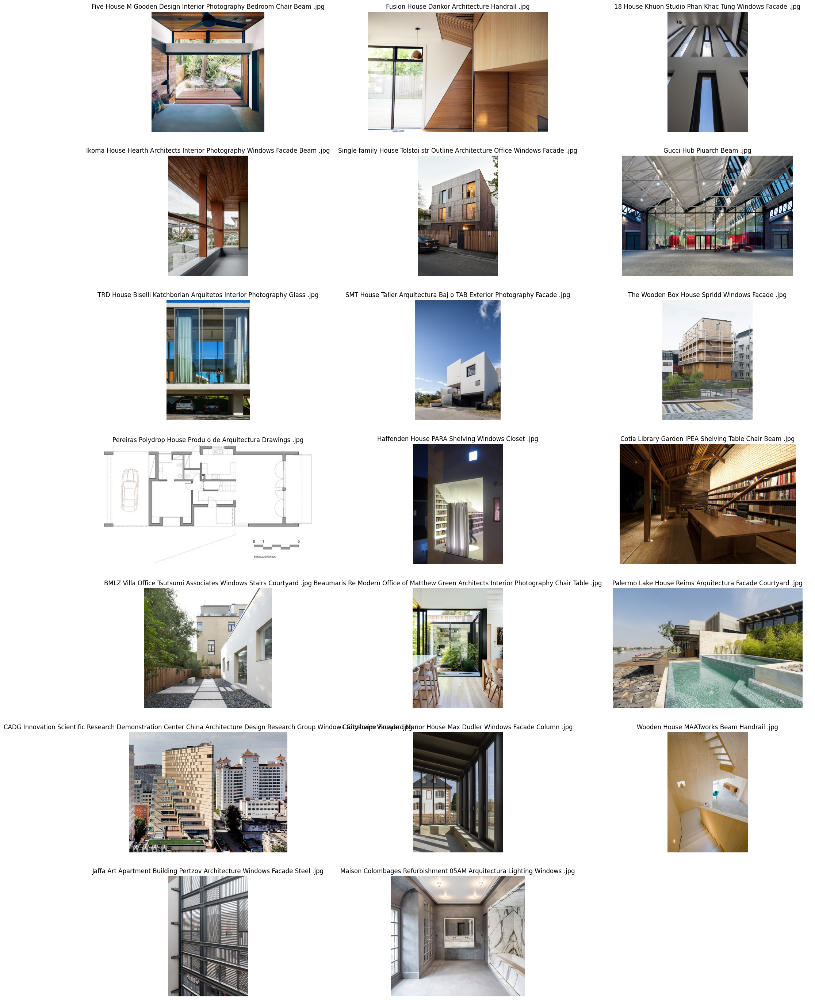

In [78]:
filenames = []

for i in range(20):
    image, filename = dataset[random.randint(0, len(dataset))]
    filenames.append((filename, filename.split("/")[-1]))

_ = show_images_with_titles(filenames)


torch.Size([3, 224, 224])
/workspaces/fast.ai/data/modern_architecture/Appartments/Appartments/I-K/Kuala Lumpur House SCDA Architects Interior Photography Living Room Sofa Table .jpg


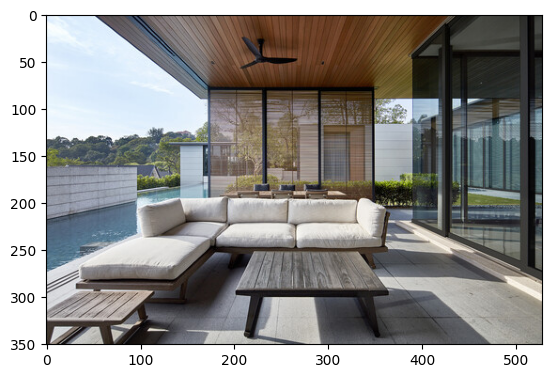

In [17]:
index=9
img, filename = dataset[index]
print(img.shape)
print(filename)
show_image(filename)

# plt.imshow(dataset[index][0])
# print(dataset[index][1])

In [18]:
def ImageFilenameCollator(batch):
    # print(batch)
    return torch.stack([x[0] for x in batch]), [x[1] for x in batch]


dataloader = DataLoader(dataset, batch_size=2, shuffle=False, collate_fn=ImageFilenameCollator)

In [ ]:
# Display image and label.
# images, filenames = next(iter(dataloader))

# print(images.shape)
# print(filenames)
# print(f"images batch shape: {images.size()}")
# print(f"filenames batch shape: {len(filenames)}")
# img = images[0].squeeze()
# label = filenames[0]
# plt.imshow(img.permute(1, 2, 0), cmap="gray")

In [21]:
# with torch.no_grad():
#   embedding = model.encode_image(images.cuda()).float()
# embedding.cpu().shape

## Database Setup

In [19]:
import psycopg2
from psycopg2.extras import execute_values
import os
from dotenv import load_dotenv
# load from .env file.
%load_ext dotenv
%dotenv

In [20]:
class VectorDB():
    def __init__(self, db="mydb", user="postgres"):
        self.conn = psycopg2.connect(
          host=os.environ.get("PG_HOST"),
          database=os.environ.get("PG_NAME"),
          user=os.environ.get("PG_USER"),
          password=os.environ.get("PG_PASSWORD"))
        self.cur = self.conn.cursor()

    def query(self, query):
        self.cur.execute(query)

    def insert(self, records: list):
        try: 
            # self.cur.execute("INSERT INTO vectortb (id, file_name, image_vector) VALUES (%s, %s, %s)", (id, file_name, image_vector,))
            execute_values(self.cur, "INSERT INTO vectortb (file_name, image_vector) VALUES %s", records)
            self.conn.commit()
        except Exception as e:
            self.conn.rollback()
            print(e)

    def select(self, id):
        self.cur.execute("SELECT * FROM vectortb WHERE id = %s", (id,))
        return self.cur.fetchone()
    
    def select_all(self):
        self.cur.execute("SELECT * FROM vectortb")
        return self.cur.fetchall()
    
    def delete_all(self):
        self.cur.execute("DELETE FROM vectortb")
        self.conn.commit()
    
    def distance(self, image_vector, k=5):
        self.cur.execute("SELECT id, file_name, image_vector, (image_vector <-> %s) AS distance FROM vectortb ORDER BY distance LIMIT %s", (image_vector, k,))
        return self.cur.fetchall()
    
    def cosine_similarity(self, image_vector, k=5):
        self.cur.execute("SELECT id, file_name, image_vector, 1 - (image_vector <=> %s) AS similarity FROM vectortb ORDER BY similarity DESC LIMIT %s", (image_vector, k,))
        return self.cur.fetchall()

    def close(self):
        self.cur.close()
        self.conn.close()

    def __del__(self):
        self.close()

vector_db = VectorDB()

## Build embedding and store it

In [ ]:
# dataloader = DataLoader(dataset, batch_size=64, shuffle=False, collate_fn=ImageFilenameCollator, num_workers=4)

# batch_no = 0
# for images, filenames in dataloader:
#     print(f"batch: {batch_no}")
#     batch_no += 1
#     if batch_no < 232:
#         continue

#     with torch.no_grad():
#         embedding = model.encode_image(images.cuda()).float()
#         embedding = embedding.cpu().numpy().tolist()
#         embedding = [x.__repr__() for x in embedding]
#         records = list(zip(filenames, embedding))
#         vector_db.insert(records)
#     # break



In [57]:
# vector_db.delete_all()
# vector_db.select_all()

[]

## To Explore
- similar image search
- duplicate image search
- semantic text search of images
- portfolio search / recommendation


In [41]:
def get_similar_images_from_embedding(embedding, k=5):
    # find similar images
    query_response = vector_db.cosine_similarity(embedding.tolist().__repr__(), k=k)
    similar_images = [(x[1], x[3]) for x in query_response]
    return similar_images

### Similar Image Search

array([<AxesSubplot: title={'center': 'original'}>, <AxesSubplot: >,
       <AxesSubplot: >], dtype=object)

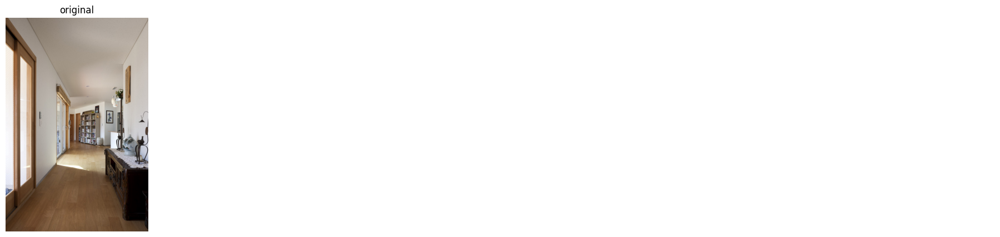

In [47]:
image, filename = dataset[775]
show_images_with_titles([(filename, "original")])

array([<AxesSubplot: title={'center': '0.999999995542787'}>,
       <AxesSubplot: title={'center': '0.828031041931007'}>,
       <AxesSubplot: title={'center': '0.82694608729773'}>,
       <AxesSubplot: title={'center': '0.824310961063822'}>,
       <AxesSubplot: title={'center': '0.822544712955218'}>,
       <AxesSubplot: >], dtype=object)

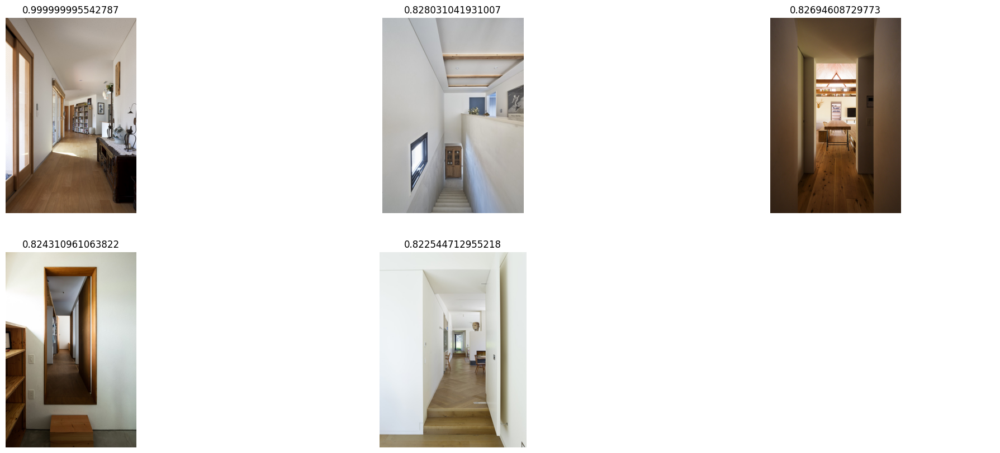

In [48]:
# encode image with model
with torch.no_grad():
    image_embedding = model.encode_image(image.unsqueeze(0).cuda()).float().cpu().numpy()[0]

similar_images = get_similar_images_from_embedding(image_embedding)
show_images_with_titles(similar_images)

### Duplicate Image Search

In [55]:
# write watermark text on image
def watermark_image(image, text, color=(255, 255, 255, 125)):
    width, height = image.size

    transparent = Image.new('RGBA', (width, height), (0,0,0,0))
    transparent.paste(image, (0,0))

    txt = Image.new('RGBA', image.size, (255,255,255,0))
    draw = ImageDraw.Draw(txt)
    font = ImageFont.truetype("DejaVuSans.ttf", size=60)
    #Positioning Text
    # textwidth, textheight = draw.textsize(text, font)
    textleft, texttop, textright, textbottom = font.getbbox(text)
    textwidth, textheight = textright-textleft, textbottom-texttop
    width, height = image.size
    x=width/2-textwidth/2
    y=height-textheight-height/2

    #Applying Text
    draw.text((x,y), text, fill=color, font=font)

    transparent.paste(txt, (0,0), mask=txt)
    return transparent

(528, 351)


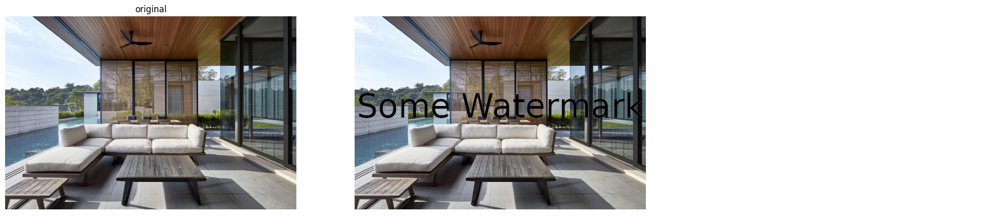

In [133]:
image, filename = dataset[9]
axs = show_images_with_titles([(filename, "original")])

image = Image.open(filename).convert('RGB')
print(image.size)
image = watermark_image(image, 'Some Watermark', color=(0, 0, 0, 255))
# image.show()
axs[1].imshow(image)


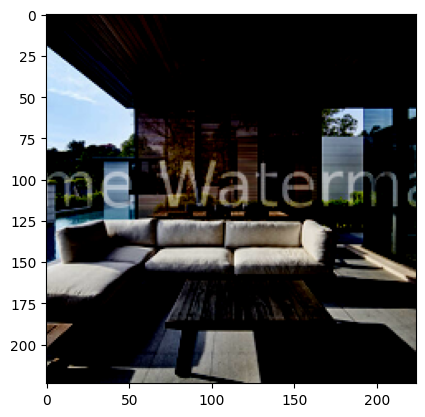

In [57]:
test_image = preprocess(image)
plt.imshow(test_image.permute(1, 2, 0))

(528, 351)


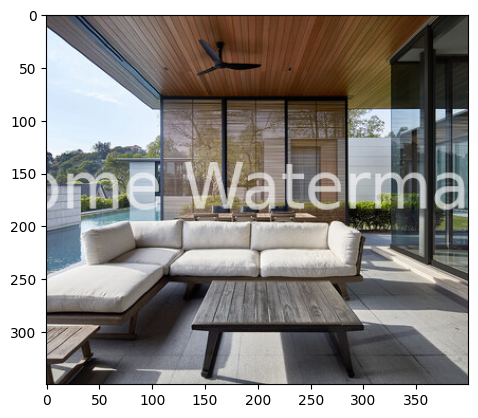

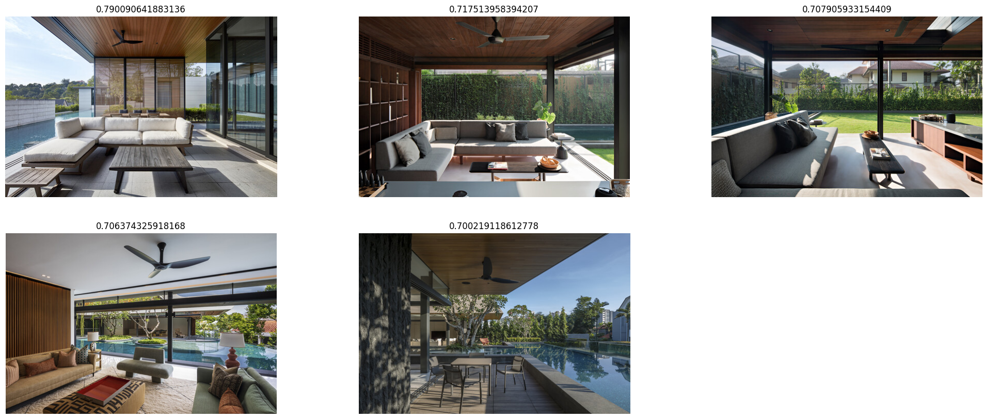

In [221]:
# testing that that some sort of distortion will still do a good match
distort = transforms.Compose([transforms.ToTensor(), transforms.CenterCrop((350,400)), transforms.ToPILImage()])  # works even if we crop (350,350) with 0.799 similarity. 224,224 matches 0.65
# distort = transforms.Compose([transforms.ToTensor(), transforms.GaussianBlur(kernel_size=501), transforms.ToPILImage()]) # matched top 1 with 0.57 similarity
# distort = transforms.Compose([transforms.ToTensor(), transforms.RandomHorizontalFlip(p=0.9), transforms.ToPILImage()]) # matched top 1 with 0.75 similarity
# distort = transforms.Compose([transforms.ToTensor(), transforms.RandomRotation(degrees=180), transforms.ToPILImage()]) # no match in top 5
# distort = transforms.Compose([transforms.ToTensor(), transforms.Grayscale(num_output_channels=1), transforms.ToPILImage()]) # matched top 1 with 0.59 similarity
# distort = transforms.Compose([transforms.ToTensor(), transforms.Resize((700, 1050)), transforms.ToPILImage()]) # matched top 1 with various resizes


_, filename = dataset[9]
image = Image.open(filename).convert('RGB')
print(image.size)
image = distort(image)
image_watermark = watermark_image(image, 'Some Watermark')
plt.imshow(image_watermark)
# Image.open("watermarked.jpg")
image = preprocess(image_watermark)

# encode image with model
with torch.no_grad():
    image_embedding = model.encode_image(image.unsqueeze(0).cuda()).float().cpu().numpy()[0]

similar_images = get_similar_images_from_embedding(image_embedding, k=5) #weirdly k=1 returns a different top result than k=5
# for x in similar_images:
#     print(x[0])
axs = show_images_with_titles(similar_images)


### comparison with OpenCV Discrete Cosine Transform

In [ ]:
import glob
import cv2
import numpy as np
import scipy.spatial

# read all image names in database directory
image_names = glob.glob('/workspaces/fast.ai/data/modern_architecture/**/*.jpg', recursive=True)
image_names = sorted(image_names[0:40000])
print(len(image_names))
def hash_array_to_hash_hex(hash_array):
  # convert hash array of 0 or 1 to hash string in hex
  hash_array = np.array(hash_array, dtype = np.uint8)
  hash_str = ''.join(str(i) for i in 1 * hash_array.flatten())
  return (hex(int(hash_str, 2)))

def hash_hex_to_hash_array(hash_hex):
  # convert hash string in hex to hash values of 0 or 1
  hash_str = int(hash_hex, 16)
  array_str = bin(hash_str)[2:]
  return np.array([i for i in array_str], dtype = np.float32)

# hash dictionary to store hash values on images
image_hash_dict = {}

# for every image calcuate PHash value
for name in image_names:
  print(name)
  img = cv2.imread(name)
  # resize image and convert to gray scale
  img = cv2.resize(img, (64, 64))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img = np.array(img, dtype = np.float32)
  # calculate dct of image
  dct = cv2.dct(img)
  # to reduce hash length take only 8*8 top-left block
  # as this block has more information than the rest
  dct_block = dct[: 8, : 8]
  # caclulate mean of dct block excluding first term i.e, dct(0, 0)
  dct_average = (dct_block.mean() * dct_block.size - dct_block[0, 0]) / (dct_block.size - 1)
  # convert dct block to binary values based on dct_average
  dct_block[dct_block < dct_average] = 0.0
  dct_block[dct_block != 0] = 1.0
  # store hash value
  image_hash_dict[name] = hash_array_to_hash_hex(dct_block.flatten())



(528, 351)
0.21875: /workspaces/fast.ai/data/modern_architecture/Appartments/Appartments/F-H/G House Architetto Alfredo Vanotti Facade Concrete .jpg is the likely a duplicate image of one you given
0.171875: /workspaces/fast.ai/data/modern_architecture/Appartments/Appartments/I-K/Kuala Lumpur House SCDA Architects Interior Photography Living Room Sofa Table .jpg is the likely a duplicate image of one you given


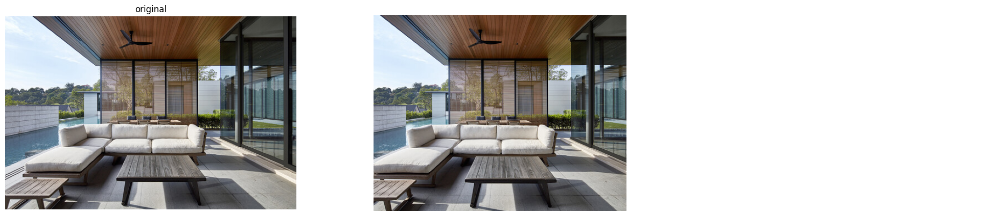

In [233]:
def hash_image(image):
  img = cv2.imread(image)
  # resize image and convert to gray scale
  img = cv2.resize(img, (64, 64))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img = np.array(img, dtype = np.float32)
  # calculate dct of image
  dct = cv2.dct(img)
  # to reduce hash length take only 8*8 top-left block
  # as this block has more information than the rest
  dct_block = dct[: 8, : 8]
  # caclulate mean of dct block excluding first term i.e, dct(0, 0)
  dct_average = (dct_block.mean() * dct_block.size - dct_block[0, 0]) / (dct_block.size - 1)
  # convert dct block to binary values based on dct_average
  dct_block[dct_block < dct_average] = 0.0
  dct_block[dct_block != 0] = 1.0
  # store hash value
  return dct_block.flatten()


# testing that that some sort of distortion will still do a good match
distort = transforms.Compose([transforms.ToTensor(), transforms.CenterCrop((350,450)), transforms.ToPILImage()]) # the smaller the crop the harder it is to find a match
# distort = transforms.Compose([transforms.ToTensor(), transforms.GaussianBlur(kernel_size=501), transforms.ToPILImage()]) # matched
# distort = transforms.Compose([transforms.ToTensor(), transforms.RandomHorizontalFlip(p=0.9), transforms.ToPILImage()]) # matched
# distort = transforms.Compose([transforms.ToTensor(), transforms.RandomRotation(degrees=180), transforms.ToPILImage()]) # matched
# distort = transforms.Compose([transforms.ToTensor(), transforms.Grayscale(num_output_channels=1), transforms.ToPILImage()]) # matched
# distort = transforms.Compose([transforms.ToTensor(), transforms.Resize((700, 1050)), transforms.ToPILImage()]) # matched with various resizes

image, filename = dataset[9]
axs = show_images_with_titles([(filename, "original")])

image = Image.open(filename).convert('RGB')
print(image.size)
image = distort(image)
image_watermark = image #watermark_image(image, 'Some Watermark')
image_watermark.convert('RGB').save('watermarked.jpg')
axs[1].imshow(image)

# userimage = input("enter the image name to compare: ")
userimage = "watermarked.jpg"
userimage_hash_array = hash_image(userimage)
for image_name in image_hash_dict.keys():
  distance = scipy.spatial.distance.hamming(
    hash_hex_to_hash_array(image_hash_dict[image_name]),
    userimage_hash_array
  )
  # print("{0:<30} {1}".format(image_name, distance))
  if distance < 0.25 :
   print(f'{distance}: {image_name} is the likely a duplicate image of one you given')

### Semantic Text Search of Images

In [62]:
from open_clip import tokenizer

def generate_text_embedding(text, template="This is a photo of {}"):
    text_tokens = tokenizer.tokenize(template.format(text))
    with torch.no_grad():
        text_features = model.encode_text(text_tokens.cuda()).float()
    return text_features.cpu()[0].numpy()

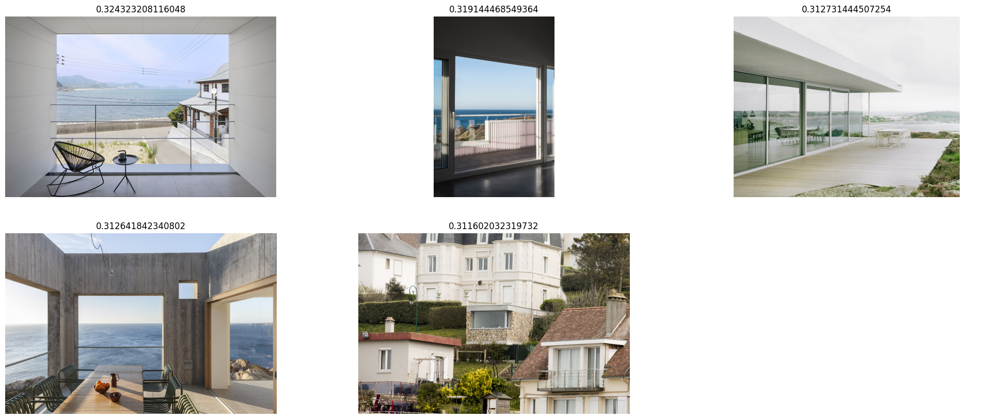

In [69]:
# text_embedding = generate_text_embedding("a kitchen with a wooden table")
# text_embedding = generate_text_embedding("a kitchen with a granite table")
# text_embedding = generate_text_embedding("a house", template="This is a floorplan of {}")
# text_embedding = generate_text_embedding("a house with a pool", template="This is an image of {}")
# text_embedding = generate_text_embedding("a house with a pool", template="This is a photo of {}")
# text_embedding = generate_text_embedding("a house with water view")
text_embedding = generate_text_embedding("a house with sea view")
# 
# find similar images
similar_images = get_similar_images_from_embedding(text_embedding)
axs = show_images_with_titles(similar_images)


### Negative Search

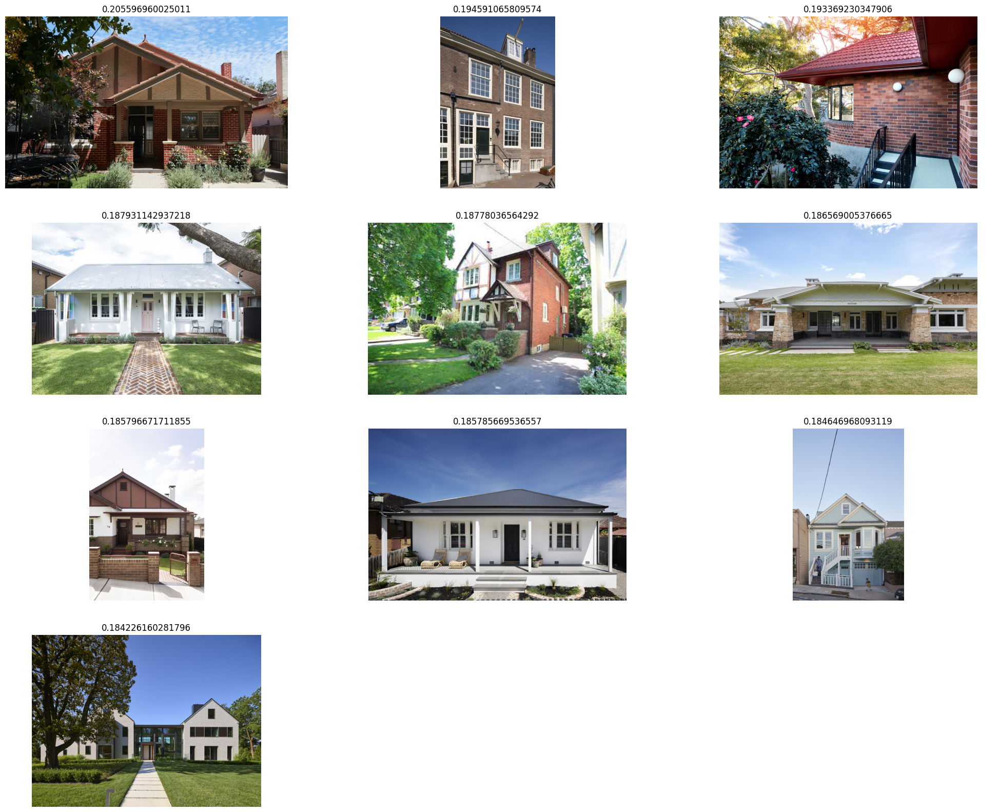

In [71]:
text_embedding = generate_text_embedding("the front of a house with a fence")
negative_embedding = generate_text_embedding("fence", template="{}")

search_embedding = text_embedding - negative_embedding
similar_images = get_similar_images_from_embedding(search_embedding, k=10)
axs = show_images_with_titles(similar_images)

### Portfolio search / recommendation

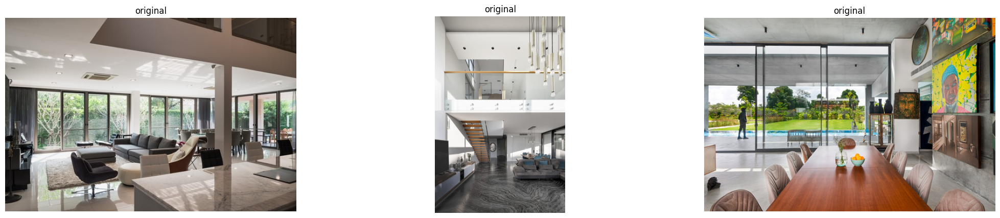

In [72]:
# needs some more exploration

# image1, filename1 = dataset[random.randint(0, len(dataset))]
# image2, filename2 = dataset[random.randint(0, len(dataset))]
# image3, filename3 = dataset[random.randint(0, len(dataset))]
image1, filename1 = dataset[555]
image2, filename2 = dataset[551]
image3, filename3 = dataset[557]

axs = show_images_with_titles([(filename1, "original"), (filename2, "original"), (filename3, "original")])

(768,)


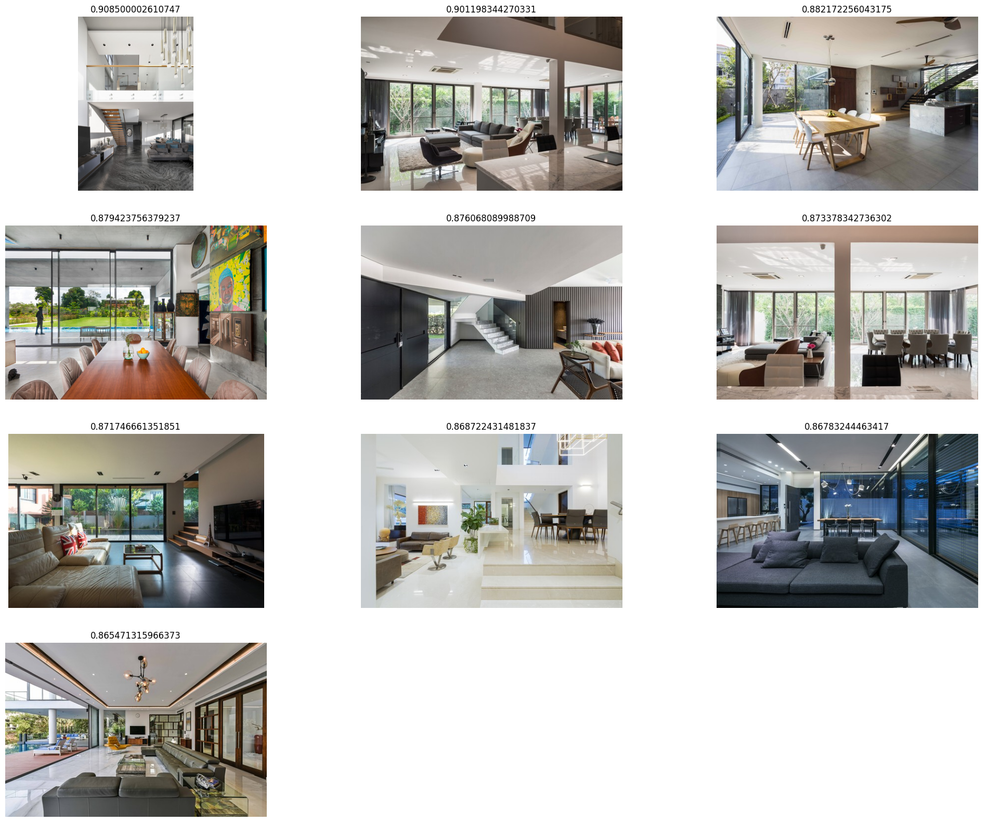

In [73]:
images = torch.stack([image1, image2, image3])
with torch.no_grad():
    image_embeddings = model.encode_image(images.cuda()).float().cpu().numpy()

average_embedding = image_embeddings.mean(axis=0)
print(average_embedding.shape)

similar_images = get_similar_images_from_embedding(average_embedding, k=10)
axs = show_images_with_titles(similar_images)

### Reverse Caption

In [34]:
caption_model, _, caption_preprocess = open_clip.create_model_and_transforms(
  cache_dir="/workspaces/fast.ai/models",
  model_name="coca_ViT-L-14",
  pretrained="mscoco_finetuned_laion2B-s13B-b90k",
  device="cuda"
)
#_ = caption_model.cuda()


a room with two blue doors and a wooden floor . 


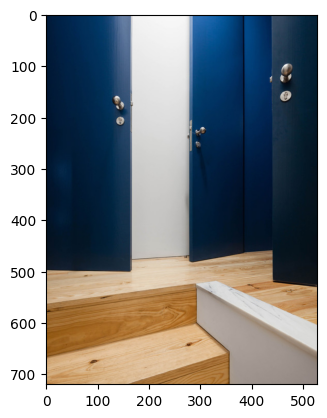

In [77]:
_, filename = dataset[random.randint(0, len(dataset))]

image = Image.open(filename).convert('RGB')
plt.imshow(image)
image = caption_preprocess(image)
image = image.unsqueeze(0)

with torch.no_grad(), torch.cuda.amp.autocast():
  generated = caption_model.generate(image.cuda())

generated_text = tokenizer.decode(generated.cpu()[0])
print(generated_text.split("<end_of_text>")[0].replace("<start_of_text>", ""))


# Ideas
### VectorDB
- simple use cases without image: 
  - compress property description into embeddings to achieve semantic search instead of keyword search

- use cases for not just text/image?
  - does the learned features have enough value to contribute towards an AVM? 


### Image Similarity
- reverse image search, duplicate search
- explore images of properties you love
- recommender engine based on recent viewings (how long someone stayed on a photo / just last 10 viewed). This needs some thought

### Notes for future features
- build in capability to collect data for further training / refining for our own usecase

Things to try
- take a property description and do a search?